In [1]:
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import wcs
from astropy import units as u
import pickle
import numpy as np

In [59]:
datafile  = 'L1448IRS3B_C17O_image_taper1500k.split62.fits'
hmmodelfile1='L1448N_C17O_thindisk.primary.forplot_convolved_with_beam.fits'
hmmodelfile2='L1448N_C17O_thindisk.secondary.forplot_convolved_with_beam.fits'
hmmodelfile3='L1448N_C17O_thindisk.opaque.forplot_convolved_with_beam.fits'

data     = fits.open(datafile)
hmmodel1 = fits.open(hmmodelfile1)
hmmodel2 = fits.open(hmmodelfile2)
hmmodel3 = fits.open(hmmodelfile3)
header = data[0].header

w = wcs.WCS(header).celestial

indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not have leading zeroes.
indices in parameterized keywords must not have leading zeroes. [astropy.wcs.wcs]
indices in parameterized keywords must not

In [60]:
scidata = data[0].data

hmmodeldata1 = hmmodel1[0].data
hmmodeldata2 = hmmodel2[0].data
hmmodeldata3 = hmmodel3[0].data
hmmodel1.close()
hmmodel2.close()
hmmodel3.close()

In [61]:
hmmodeldata = hmmodeldata1 + hmmodeldata2 - hmmodeldata3

In [62]:
print(scidata.shape,hmmodeldata1.shape,hmmodeldata.shape)
Nz,Ny,Nx = hmmodeldata.shape

(1, 62, 2048, 2048) (62, 2048, 2048) (62, 2048, 2048)


In [63]:
print(w)
distpc = 230.
dist1as = (1/3600 * u.degree.to(u.rad)\
        * distpc *u.parsec.to(u.au))
print(dist1as)

WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---SIN'  'DEC--SIN'  
CRVAL : 51.40158750002  30.754086111109999  
CRPIX : 1025.0  1025.0  
PC1_1 PC1_2  : 1.0  0.0  
PC2_1 PC2_2  : 0.0  1.0  
CDELT : -5.5555555555559997e-06  5.5555555555559997e-06  
NAXIS : 2048  2048  62  1
229.999999998198


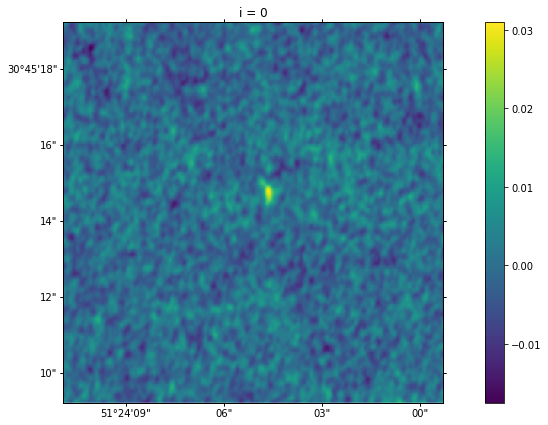

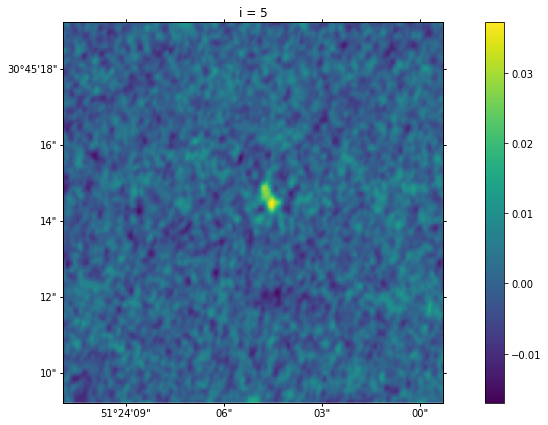

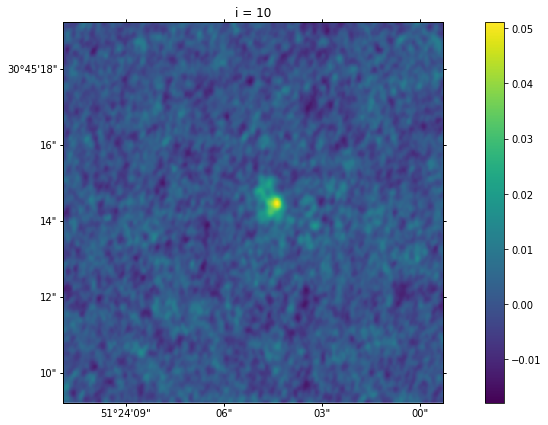

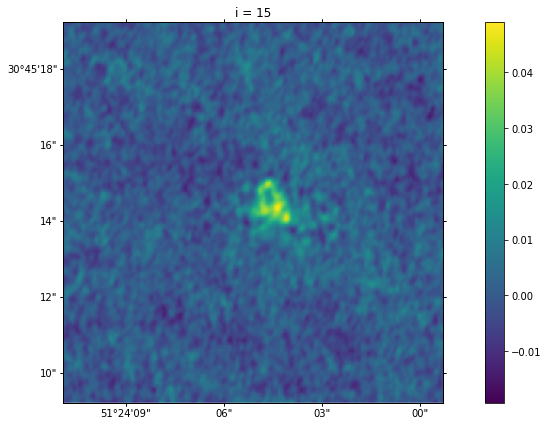

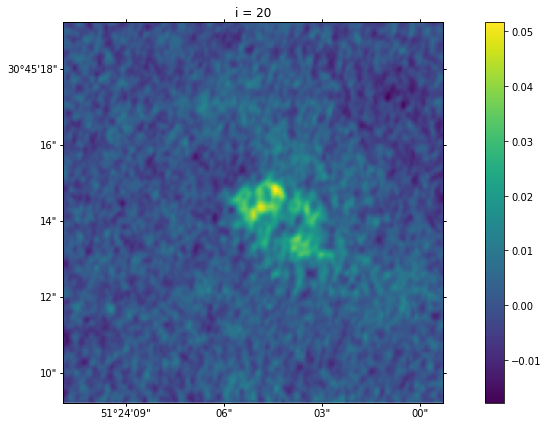

...

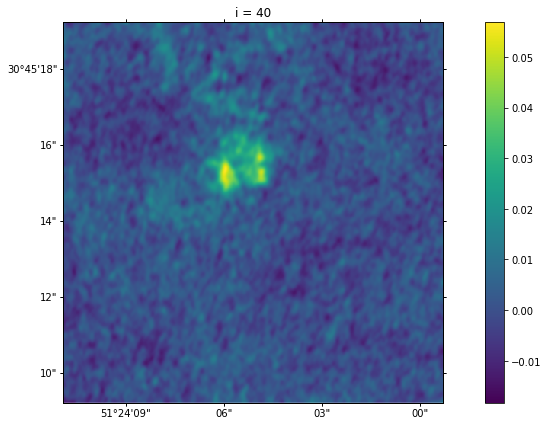

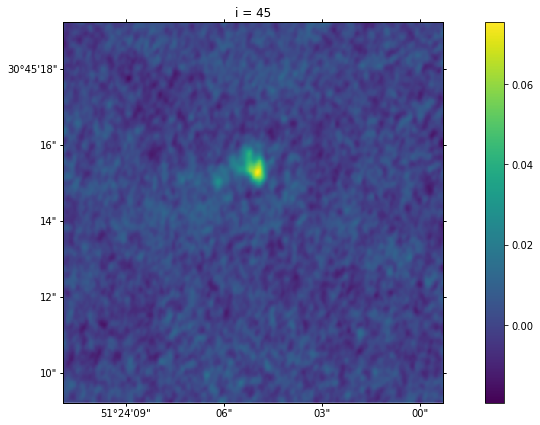

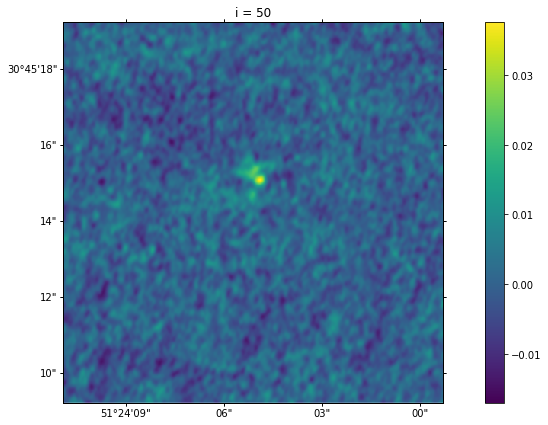

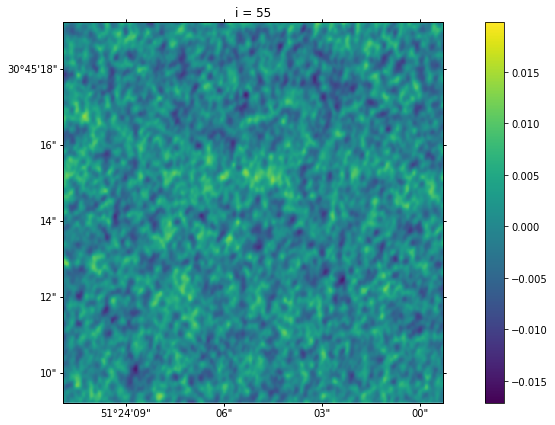

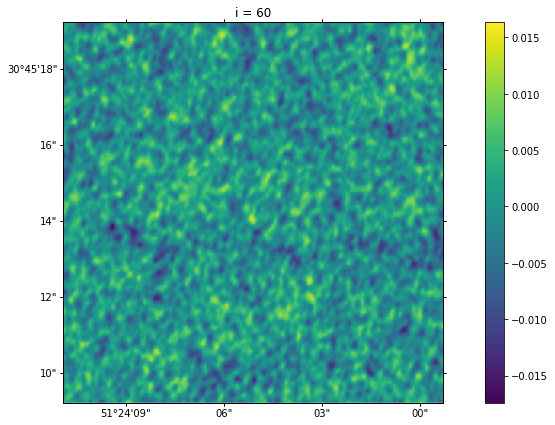

In [64]:
plt.clf()
for i in range(0, Nz):
    if i %5 == 0:
        fig = plt.figure(figsize=[15,7])
        fig.add_subplot(111, projection=w)
        cb1 = plt.imshow(scidata[0,i,:,:], origin = 'lower')
        plt.xlim(800,1300)
        plt.ylim(750,1250)
        plt.colorbar(cb1)
        plt.title('i = ' + str(i))
        plt.show()

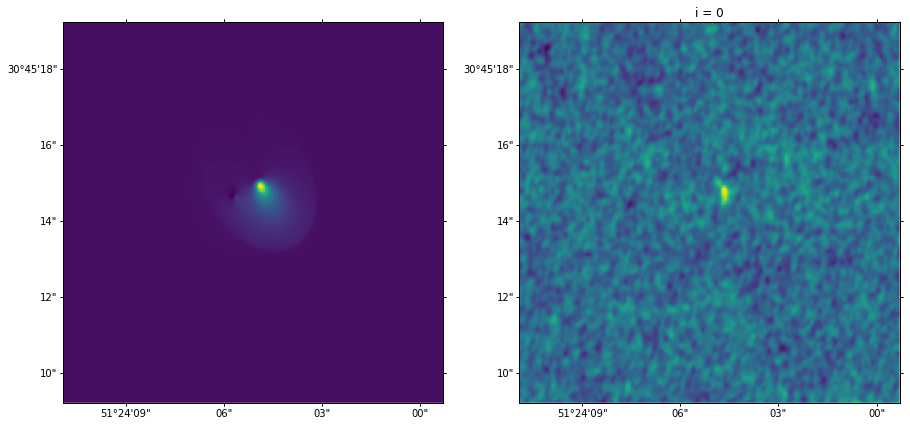

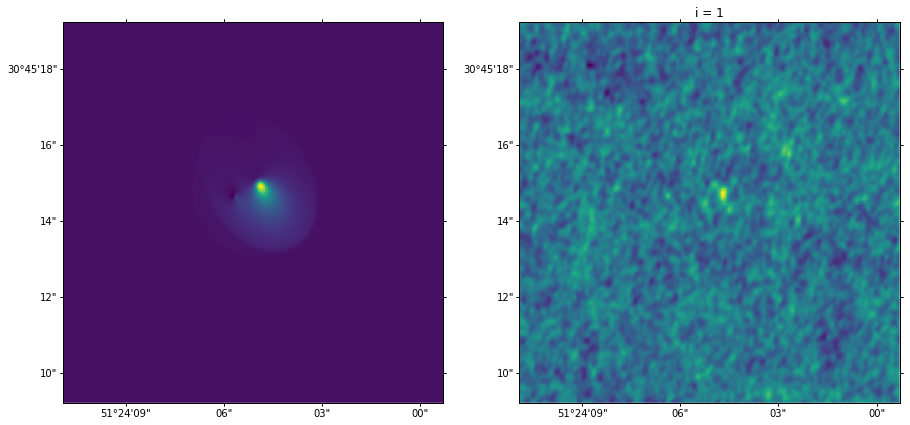

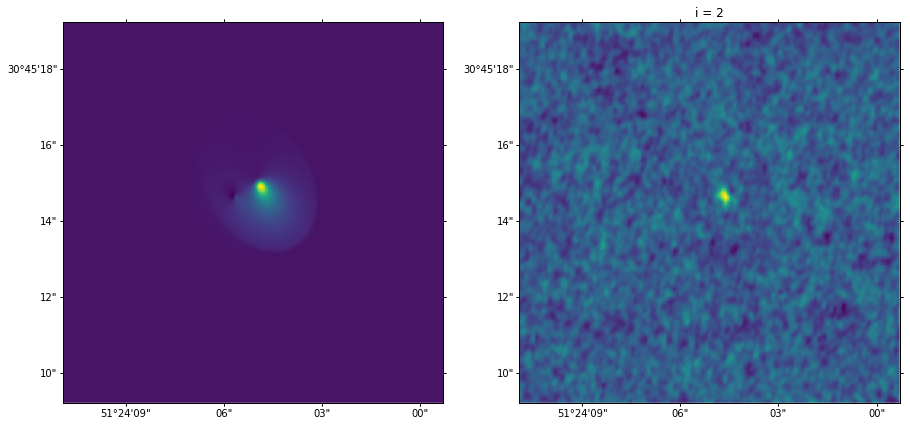

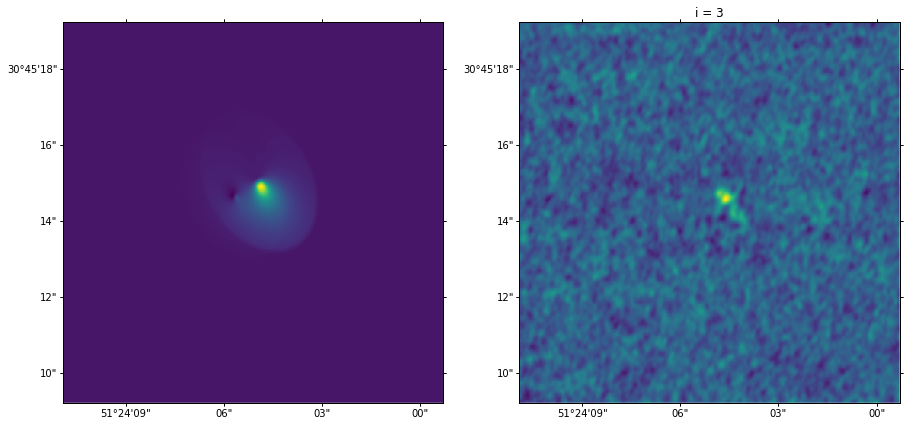

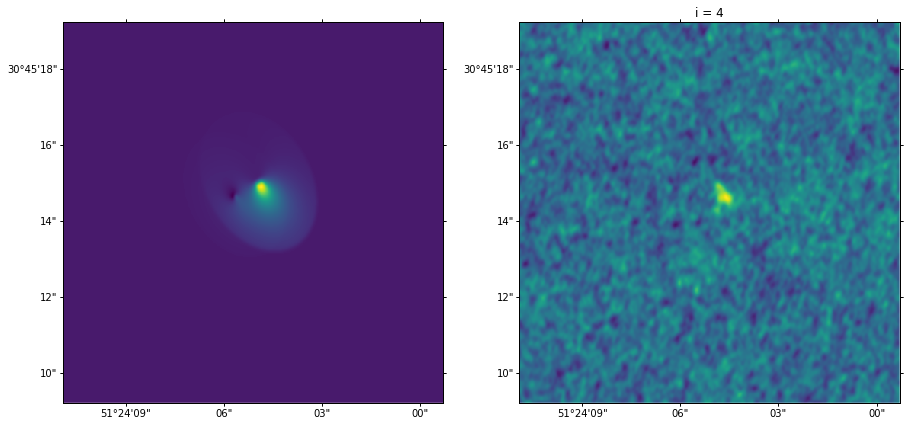

...

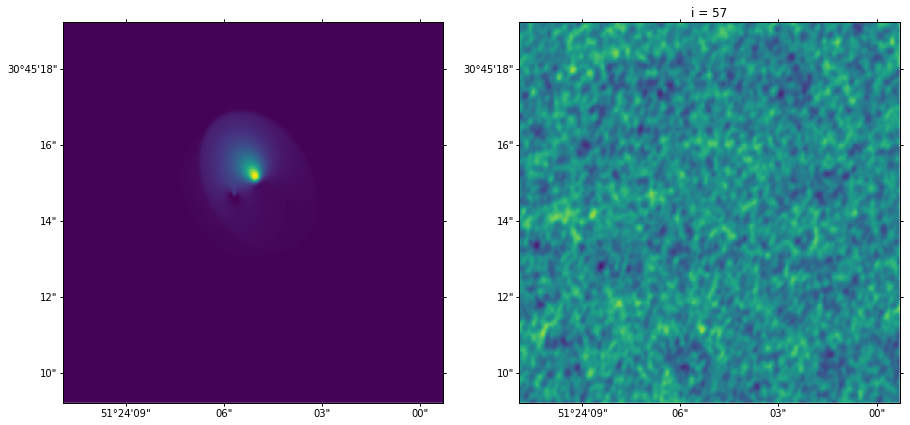

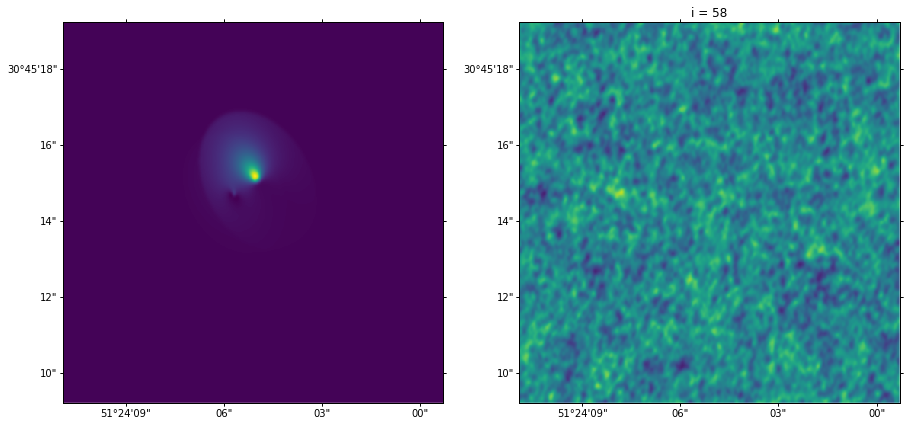

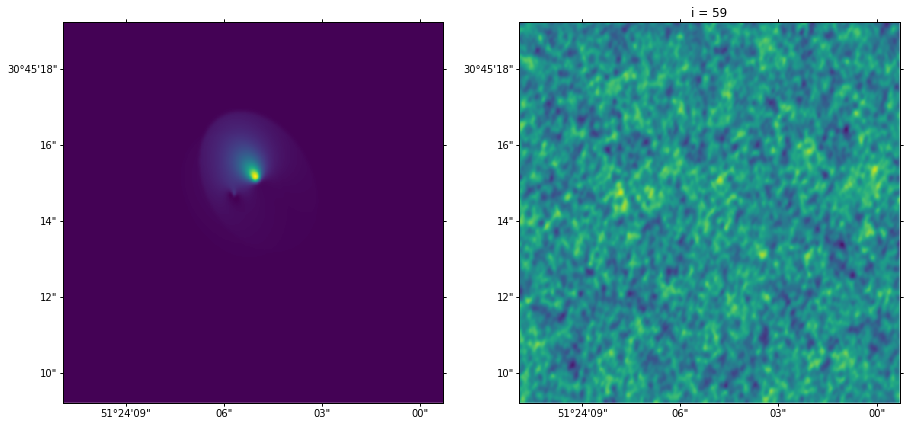

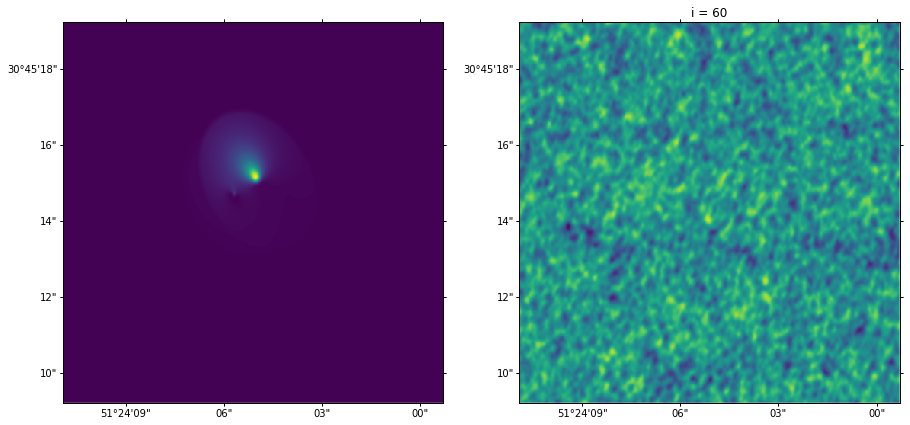

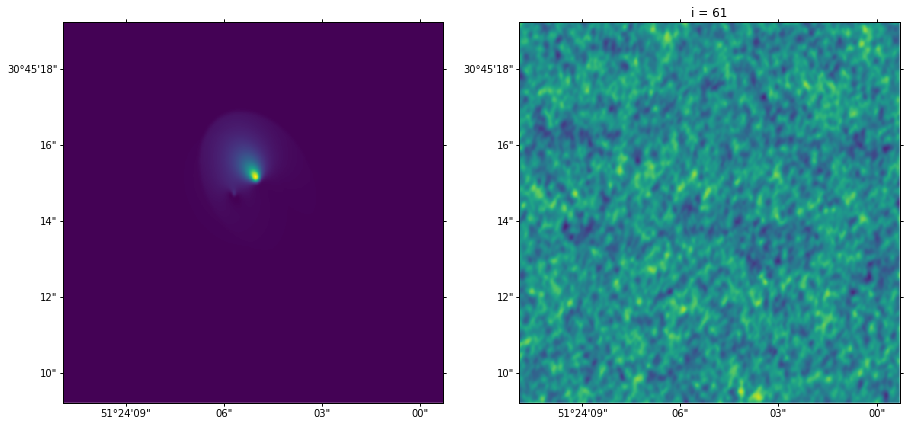

In [65]:
plt.clf()
for i in range(0, Nz):
    f, (ax1, ax2) = plt.subplots(1, 2,sharey=True,figsize=[15,7], subplot_kw=dict(projection=w))
    cb1 = ax1.imshow(hmmodeldata[i,:,:], origin = 'lower')
    cb2 = ax2.imshow(scidata[0,i,:,:], origin = 'lower')
    ax1.set_xlim(800,1300)
    ax1.set_ylim(750,1250)
    ax2.set_xlim(800,1300)
    ax2.set_ylim(750,1250)
    #plt.colorbar(cb1)
    #plt.colorbar(cb2)
    plt.title('i = ' + str(i))
    plt.show()

In [66]:
moddata = hmmodeldata
numr = 1
numc = 5
levels = np.arange(0.025,0.1,0.02)
levels = np.arange(0.025,0.05,0.01)
channels = [0,15,30,40,50]
velrange  = [x* 0.11 + 1.49 for x in channels]

xmin=950
xmax=1150
ymin=None#500
ymax=None#1300

linx =960
liny = 35
widthx=25
widthy=10
dist = dist1as/2

plt.clf()
fig, ax = plt.subplots(nrows=numr, ncols=numc,sharex=True,sharey=True,\
                      subplot_kw=dict(projection=w))
fig.suptitle(r"L1448N C$^{17}$O", fontsize=16)
for i in range(numc):
    q = channels[i]
    '''
    im = ax[i].imshow(moddata[q,xmin:xmax,ymin:ymax], origin = 'lower')
    CS = ax[i].contour(scidata[0,q,xmin:xmax,ymin:ymax], levels,
                 origin='lower',
                 linewidths=2)
    '''
    im = ax[i].imshow(scidata[0,q,xmin:xmax,ymin:ymax], origin = 'lower')
    CS = ax[i].contour(moddata[q,xmin:xmax,ymin:ymax], levels,
                 origin='lower',
                 linewidths=1)
    ax[i].set_xlim(xmin,xmax)
    ax[i].set_ylim(ymin,ymax)
    txt = ax[i].annotate(r"$v=%4.1f$ km s$^{-1}$" % (velrange[i]), \
              xy=(0.05,0.85), xycoords='axes fraction',\
              weight = 'bold',color='white',\
              fontsize=15)
    ax[i].plot((linx-widthx/2,linx+widthx/2),\
               (liny,liny),color='white')
    ax[i].plot((linx-widthx/2,linx-widthx/2),\
               (liny-widthy/2,liny+widthy/2),color='white')
    ax[i].plot((linx+widthx/2,linx+widthx/2),\
               (liny-widthy/2,liny+widthy/2),color='white')
    txt1 = ax[i].annotate(r"$%4.1f$ AU" % dist, \
                          xy=(0.05,0.1), xycoords='axes fraction',\
                          weight = 'bold',color='white',\
                          fontsize=15)
#cbar = fig.colorbar(im,  ax=ax.ravel().tolist(), orientation='horizontal')
#cbar.set_label(r'Jansky/beam' )
fig.set_size_inches((35,5))
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.draw()
plt.savefig('l1448n.scichannels.pdf',dpi=1000)
plt.close()

In [67]:
numr = 1
numc = 5
levels = np.arange(0.025,0.1,0.02)
levels = np.arange(0.025,0.05,0.01)
channels = [0,15,30,40,50]
velrange  = [x* 0.11 + 1.49 for x in channels]

xmin=950
xmax=1150
ymin=None#500
ymax=None#1300

linx =960
liny = 35
widthx=25
widthy=10
dist = dist1as/2

plt.clf()
fig, ax = plt.subplots(nrows=numr, ncols=numc,sharex=True,sharey=True,\
                      subplot_kw=dict(projection=w))
fig.suptitle(r"L1448N C$^{17}$O", fontsize=16)
for i in range(numc):
    q = channels[i]
    '''
    im = ax[i].imshow(moddata[q,xmin:xmax,ymin:ymax], origin = 'lower')
    CS = ax[i].contour(scidata[0,q,xmin:xmax,ymin:ymax], levels,
                 origin='lower',
                 linewidths=2)
    '''    
    temp = None
    if q < 5:
        temp =  np.median(scidata[0,0:q+2,xmin:xmax,ymin:ymax], axis=0)
        im = ax[i].imshow(temp, origin = 'lower')
    elif q > (Nz - 5):
        temp =  np.median(scidata[0,q-2:Nz-1,xmin:xmax,ymin:ymax], axis=0)
        im = ax[i].imshow(temp, origin = 'lower')
    else:
        temp =  np.median(scidata[0,q-4:q+4,xmin:xmax,ymin:ymax], axis=0)
        im = ax[i].imshow(temp, origin = 'lower')
    CS = ax[i].contour(moddata[q,xmin:xmax,ymin:ymax], levels,
                 origin='lower',
                 linewidths=1)
    ax[i].set_xlim(xmin,xmax)
    ax[i].set_ylim(ymin,ymax)
    txt = ax[i].annotate(r"$v=%4.1f$ km s$^{-1}$" % (velrange[i]), \
              xy=(0.05,0.85), xycoords='axes fraction',\
              weight = 'bold',color='white',\
              fontsize=15)
    ax[i].plot((linx-widthx/2,linx+widthx/2),\
               (liny,liny),color='white')
    ax[i].plot((linx-widthx/2,linx-widthx/2),\
               (liny-widthy/2,liny+widthy/2),color='white')
    ax[i].plot((linx+widthx/2,linx+widthx/2),\
               (liny-widthy/2,liny+widthy/2),color='white')
    txt1 = ax[i].annotate(r"$%4.1f$ AU" % dist, \
                          xy=(0.05,0.1), xycoords='axes fraction',\
                          weight = 'bold',color='white',\
                          fontsize=15)
#cbar = fig.colorbar(im,  ax=ax.ravel().tolist(), orientation='horizontal')
#cbar.set_label(r'Jansky/beam' )
fig.set_size_inches((35,5))
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.draw()
plt.savefig('l1448n.scichannels.med.pdf',dpi=1000)
plt.close()

In [68]:
numr = 1
numc = 5
levels = np.arange(0.025,0.1,0.02)
levels = np.arange(0.025,0.05,0.01)
channels = [0,15,30,40,50]
velrange  = [x* 0.11 + 1.49 for x in channels]

xmin=950
xmax=1150
ymin=None#500
ymax=None#1300

linx =960
liny = 35
widthx=25
widthy=10
dist = dist1as/2

plt.clf()
fig, ax = plt.subplots(nrows=numr, ncols=numc,sharex=True,sharey=True,\
                      subplot_kw=dict(projection=w))
fig.suptitle(r"L1448N C$^{17}$O", fontsize=16)
for i in range(numc):
    q = channels[i]
    '''
    im = ax[i].imshow(moddata[q,xmin:xmax,ymin:ymax], origin = 'lower')
    CS = ax[i].contour(scidata[0,q,xmin:xmax,ymin:ymax], levels,
                 origin='lower',
                 linewidths=2)
    '''
    
    temp = None
    if q < 5:
        temp = scidata[0,0,xmin:xmax,ymin:ymax]
        for k in range(q+4):
            if k != 0:
                temp += scidata[0,k,xmin:xmax,ymin:ymax]
        im = ax[i].imshow(temp, origin = 'lower')
    elif q > (Nz - 5):
        temp = scidata[0,q-5,xmin:xmax,ymin:ymax]
        for k in np.arange(q-5,Nz-1,1):
            if k != (q-5):
                temp += scidata[0,k,xmin:xmax,ymin:ymax]
        im = ax[i].imshow(temp, origin = 'lower')
    else:
        temp = scidata[0,q-4,xmin:xmax,ymin:ymax]
        for k in np.arange(q-4,q+4,1):
            if k != (q-4):
                temp += scidata[0,k,xmin:xmax,ymin:ymax]
        im = ax[i].imshow(temp, origin = 'lower')
    CS = ax[i].contour(hmmodeldata[q,xmin:xmax,ymin:ymax], levels,
                 origin='lower',
                 linewidths=1)
    ax[i].set_xlim(xmin,xmax)
    ax[i].set_ylim(ymin,ymax)
    txt = ax[i].annotate(r"$v=%4.1f$ km s$^{-1}$" % (velrange[i]), \
              xy=(0.05,0.85), xycoords='axes fraction',\
              weight = 'bold',color='white',\
              fontsize=15)
    ax[i].plot((linx-widthx/2,linx+widthx/2),\
               (liny,liny),color='white')
    ax[i].plot((linx-widthx/2,linx-widthx/2),\
               (liny-widthy/2,liny+widthy/2),color='white')
    ax[i].plot((linx+widthx/2,linx+widthx/2),\
               (liny-widthy/2,liny+widthy/2),color='white')
    txt1 = ax[i].annotate(r"$%4.1f$ AU" % dist, \
                          xy=(0.05,0.1), xycoords='axes fraction',\
                          weight = 'bold',color='white',\
                          fontsize=15)
#cbar = fig.colorbar(im,  ax=ax.ravel().tolist(), orientation='horizontal')
#cbar.set_label(r'Jansky/beam' )
fig.set_size_inches((35,5))
plt.xlim(xmin,xmax)
plt.ylim(ymin,ymax)
plt.draw()
plt.savefig('l1448n.scichannels.bin.pdf',dpi=1000)
plt.close()